In [1]:
import pandas as pd
import os
import numpy as np
from enum import Enum
import sys
import gc
from pprint import pprint
sys.path.append("../src")
from sklearn.base import TransformerMixin, BaseEstimator
import re
import missingno as msno
from pathlib import Path
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import chart_studio.plotly as py
import plotly.io as pio
import plotly.graph_objects as go

from config import data_dir
from data.load import FileDataLoader, DatasetFilename
from tqdm import tqdm

# auto reload all modules
%load_ext autoreload
%autoreload 2
%matplotlib inline

PLOTS_DIR = Path('../plots')

In [2]:
class PlotMng:
    
    @staticmethod
    def save_plot(fig, plotname: str, transparent=True) -> None:
        """Save interactive plot to HTML."""
        if transparent:
            fig = PlotMng.transparent_background(fig)
        pio.write_html(fig, file=PLOTS_DIR/plotname, auto_open=True)
        
    @staticmethod
    def transparent_background(fig):
        """Save interactive plot to HTML."""
        fig.update_layout({
            "plot_bgcolor": "rgba(0, 0, 0, 0)",
            "paper_bgcolor": "rgba(0, 0, 0, 0)",
        })
        return fig

# Exploratory Data Analysis

In this notebook we want to understand what kind of data we have before approaching feature engineering.

* What information do the datasets contain
* Is there any missing data
* Investigating outliers (are they due to entry error?)
* Look at target variable
    * what is correlated with the target
    
At the end we want to know:
* how imbalanced is our data
* do we need to fill in / drop missing data
* do wee need to handle outliers
* restrict set of columns used in feature engineering

In [3]:
# get a list fo available datasets
data_io = FileDataLoader()
data_io.list_available()

['applications',
 'bureau_balance',
 'bureau',
 'credit_card_balance',
 'installments_payments',
 'previous_applications',
 'cash_balance']

In [4]:
#data_io.load_all()

for d in tqdm(['applications']):
    data_io.load_dataset(d)

  0%|                                                                     | 0/1 [00:00<?, ?it/s]2022-06-13 11:57:04 logger [78] DEBUG {'process': 'load_dataset', 'message': 'Started.', 'args': {}}
2022-06-13 11:57:07 logger [78] DEBUG {'process': 'load_dataset', 'message': 'Success.', 'elapsed_seconds': 2.1903}
100%|█████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.19s/it]


In [5]:
data_io.list_loaded()

['applications']

In [6]:
data_io['applications'].shape

(307511, 122)

## Dataset: application

## Missing Values %

In [7]:
missing_pct = data_io['applications'].isnull().mean()\
    .sort_values(ascending=False) * 100
source = missing_pct[missing_pct > 1].reset_index()
source.columns = ['Column Name', 'Missing %']
source.head(1)

,Column Name,Missing %
0,commonarea_medi,69.872297


In [8]:
source[source['Missing %'] > 0].__len__()

57

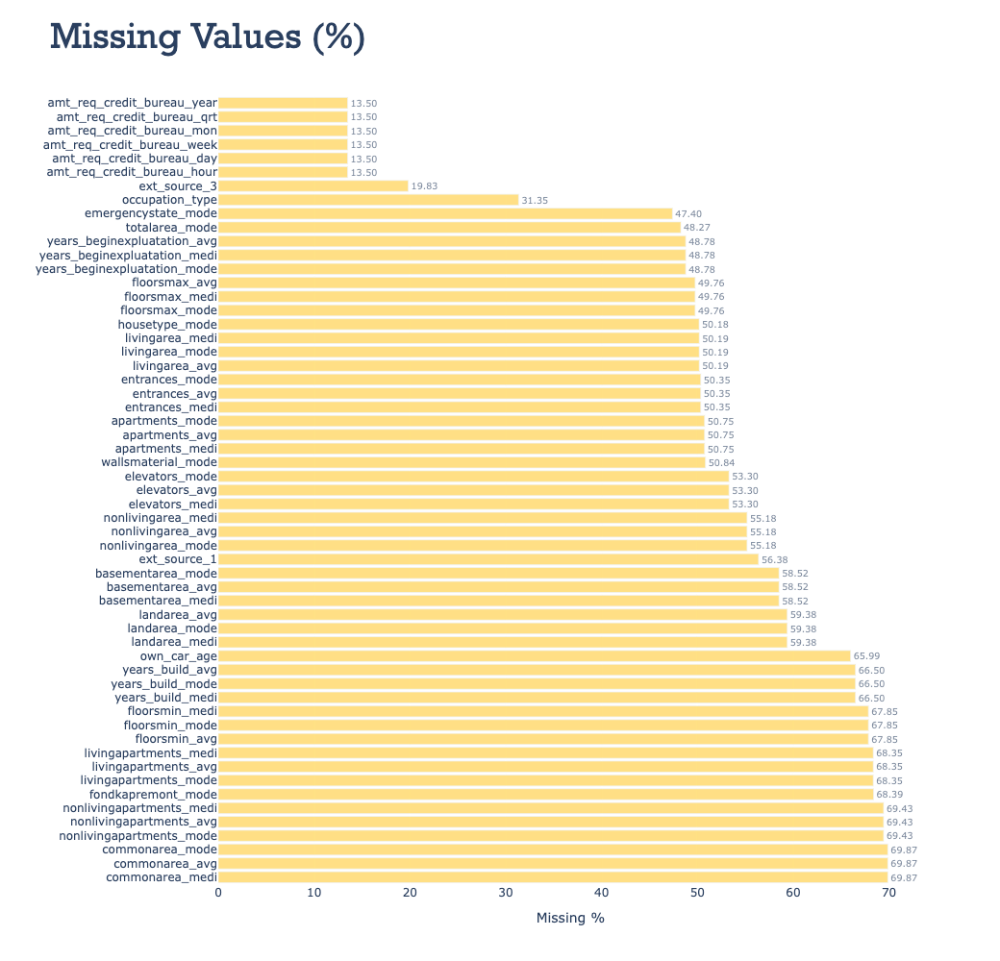

In [9]:
fig = px.bar(source, y='Column Name', x='Missing %', text_auto='.2f',
            title="Missing Values (%)",
            height=1000)

fig.update_traces(textfont_size=12,
                  textangle=0,
                  textposition="outside",
                  cliponaxis=False)
fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        yaxis=dict(title=''),
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
fig.update_traces(marker_color='#ffcc33',opacity=0.6)
PlotMng.save_plot(fig, '0_missing_pct.html')
fig.show()

In [12]:
df_missing = data_io['applications'].copy()
missing_cols = list(source['Column Name'].unique())
df_missing = df_missing[missing_cols]

for col in missing_cols:
    df_missing[col] = df_missing[col].isnull()
    
df_missing = df_missing[missing_cols]

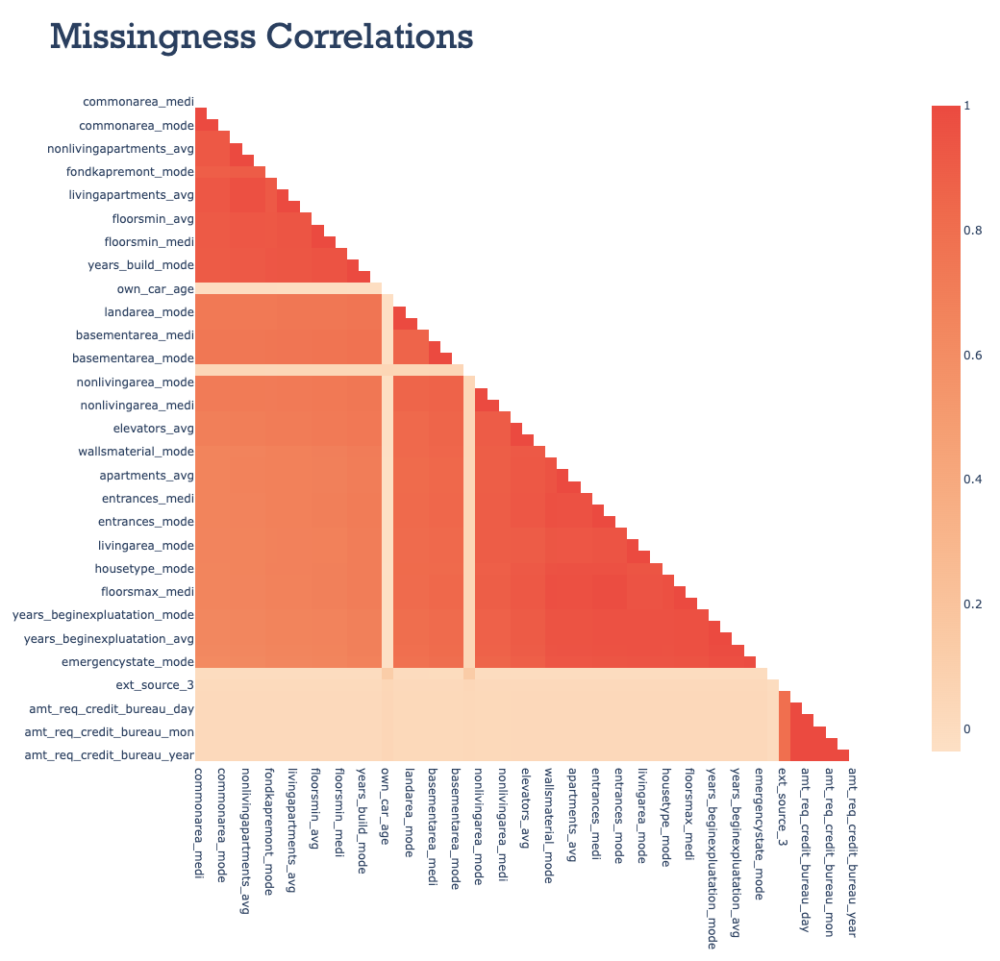

In [13]:
corr = df_missing.corr()
fig = px.imshow(corr + np.triu(np.full_like(corr, np.nan)),
               height=1000,
                width=1000,
               title='Missingness Correlations',
               color_continuous_scale=px.colors.sequential.Peach)


#fig.update_yaxes(visible=False, showticklabels=False)
#fig.update_xaxes(visible=False, showticklabels=False)
#fig.update_coloraxes(showscale=False)
fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        )
    #coloraxis_colorbar_orientation='h',
    #coloraxis_colorbar_y=-0.5
        )
fig.update_traces(colorbar_orientation='h', selector=dict(type='heatmap'))
PlotMng.save_plot(fig, '0_missingness_corr.html')
fig.show()

In [6]:
def plot_pie_pct(y):
    pct = (data_io['applications'][[y]].value_counts() \
    / data_io['applications'].shape[0] * 100)
    #pct.index = ['not defaulted', 'defaulted']

    source = pd.DataFrame(pct.T)
    source =np.round(source, 2)
    source.columns=['percentage']
    source = source.rename_axis('label').reset_index().reset_index()
    
    fig = px.pie(source, values='percentage', names='label', color='label',
             width=600, height=400, hover_name='label',
             title='How Frequent are<br> Defaults?')

    fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
    fig
    return fig

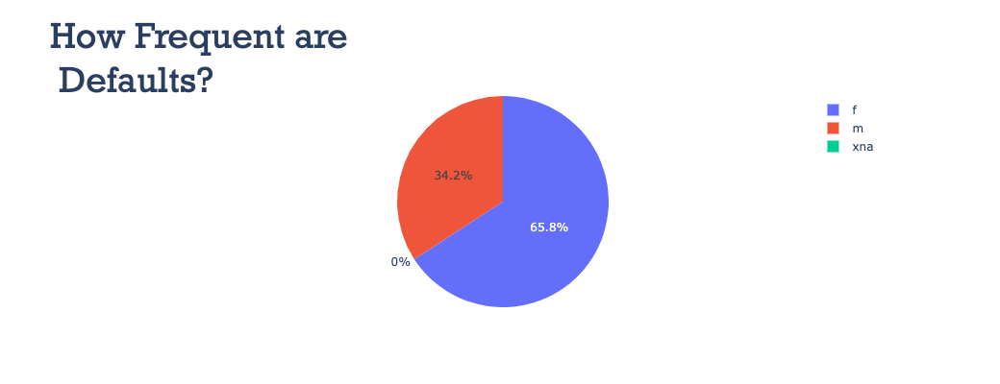

In [7]:
plot_pie_pct('code_gender')

In [33]:
def default_pct(var):
    return data_io['applications'].groupby(var).target.sum() /\
        data_io['applications'].groupby(var).target.count()

In [56]:
display(default_pct('name_contract_type'))

display(default_pct('code_gender'))

display(default_pct('occupation_type'))

name_contract_type
cash loans         0.083459
revolving loans    0.054783
Name: target, dtype: float64

code_gender
f      0.069993
m      0.101419
xna    0.000000
Name: target, dtype: float64

occupation_type
accountants              0.048303
cleaning staff           0.096067
cooking staff            0.104440
core staff               0.063040
drivers                  0.113261
high skill tech staff    0.061599
hr staff                 0.063943
it staff                 0.064639
laborers                 0.105788
low-skill laborers       0.171524
managers                 0.062140
medicine staff           0.067002
private service staff    0.065988
realty agents            0.078562
sales staff              0.096318
secretaries              0.070498
security staff           0.107424
waiters/barmen staff     0.112760
Name: target, dtype: float64

In [14]:
data_io['applications'].query('target == 1')\
    .code_gender.value_counts() / len(data_io['applications'].query('target == 1'))

f    0.570796
m    0.429204
Name: code_gender, dtype: float64

In [15]:
data_io['applications']['label'] = data_io['applications']\
    .target.map({0:'no default', 1:'default'})

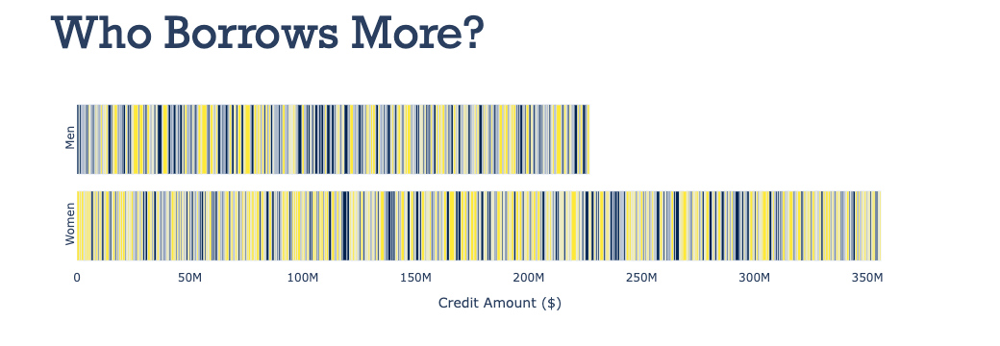

In [23]:
# do stratified sampling
df = data_io['applications']\
    .groupby('label', group_keys=False).apply(lambda x: x.sample(500)).sample(1000)

fig = px.bar(df, y="code_gender", x="amt_credit", color='target',
             title='Who Borrows More?',
            labels=dict(amt_credit="Credit Amount ($)"),
            color_continuous_scale=px.colors.sequential.Cividis_r,
            color_discrete_map={'no default':'#ffcc33',
                                'default':'#f7f6f1'})

fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=45,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                tickmode = 'array',
                tickvals = [0,1],
                ticktext = ['Women', 'Men'],
                title=''
            ))
fig.update_yaxes(visible=True, showticklabels=True, tickangle=270)
fig.update_coloraxes(showscale=False)

PlotMng.save_plot(fig, '0_barh_gender_credit_amount.html')
fig

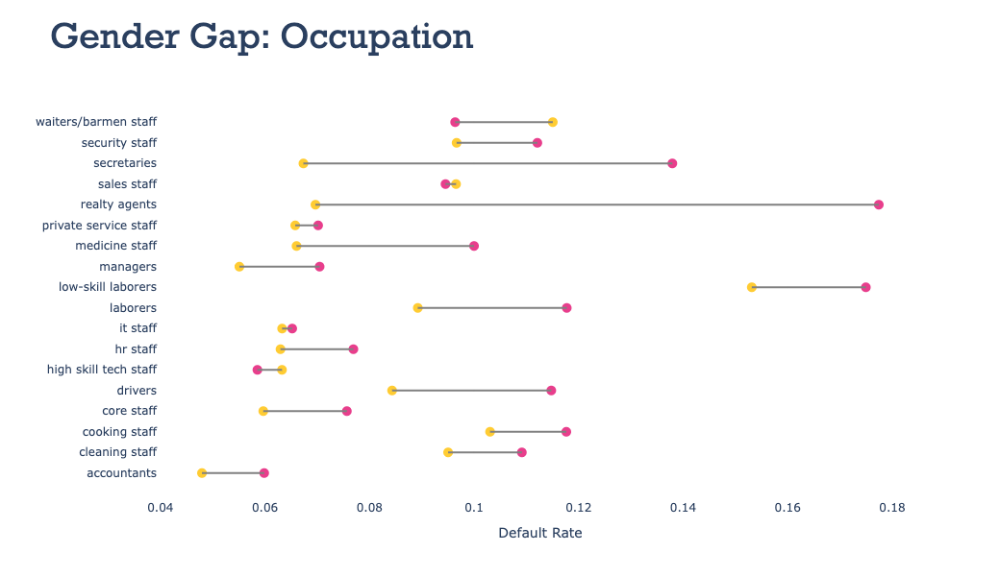

In [35]:
source = data_io['applications'].groupby(['code_gender', 'occupation_type'])\
    .mean().target.reset_index().query('code_gender != "xna"')
source.head()

# Use column names of df for the different parameters x, y, color, ...
fig = px.scatter(source, x="target", y="occupation_type", color="code_gender",
                 title="Gender Gap: Occupation",
                 height=600,
                 labels={"target":"Default Rate"},
                 color_discrete_map={'f':'#ffcc33',
                                'm':'#e83e8c'}
                )

fig.update_traces(marker_size=10)

# add lines
for occ in source.occupation_type.unique():
    data = source.query('occupation_type == @occ')
    y = [occ]*2
    x0 = data[data.code_gender == 'f'].target.iloc[0]
    x1 = data[data.code_gender == 'm'].target.iloc[0]
    x = [x0, x1]
    fig.add_trace(go.Scatter(x=x, y=y, name=occ,
                             hoverinfo='name+x', line_color='grey', mode='lines'))


fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                title=''
            ))
fig.update_layout(showlegend=False)

PlotMng.save_plot(fig, '1_gender_occupation.html')
fig

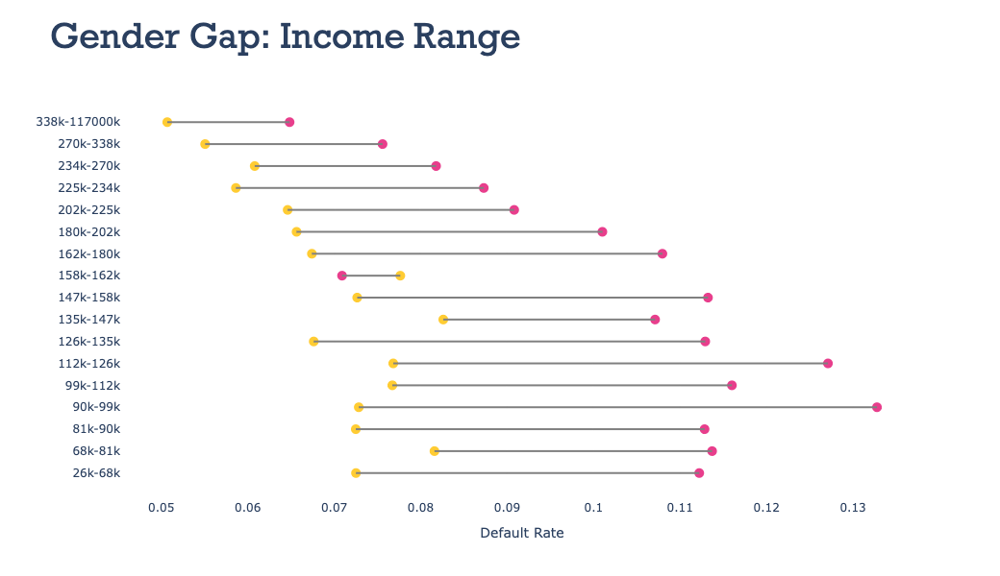

In [34]:
data_io['applications']['income_bin'] = pd.qcut(data_io['applications'].amt_income_total, 20, duplicates="drop")
source = data_io['applications'].groupby(['code_gender', 'income_bin'])\
    .mean().target.reset_index().query('code_gender != "xna"')
source['income_bin'] = source['income_bin'].apply(lambda x: f'{round(x.left/1000)}k-{round(x.right/1000)}k')

# Use column names of df for the different parameters x, y, color, ...
fig = px.scatter(source, x="target", y="income_bin", color="code_gender",
                 title="Gender Gap: Income Range",
                 height=600,
                 labels={"target":"Default Rate"},
                 color_discrete_map={'f':'#ffcc33',
                                'm':'#e83e8c'}
                )

fig.update_traces(marker_size=10)

# add lines
for b in source.income_bin.unique():
    data = source.query('income_bin == @b')
    y = [b]*2
    x0 = data[data.code_gender == 'f'].target.iloc[0]
    x1 = data[data.code_gender == 'm'].target.iloc[0]
    x = [x0, x1]
    fig.add_trace(go.Scatter(x=x, y=y, name=b,
                             hoverinfo='name+x', line_color='grey', mode='lines'))


fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                title=''
            ))
fig.update_layout(showlegend=False)

PlotMng.save_plot(fig, '1_gender_income_bin.html')
fig

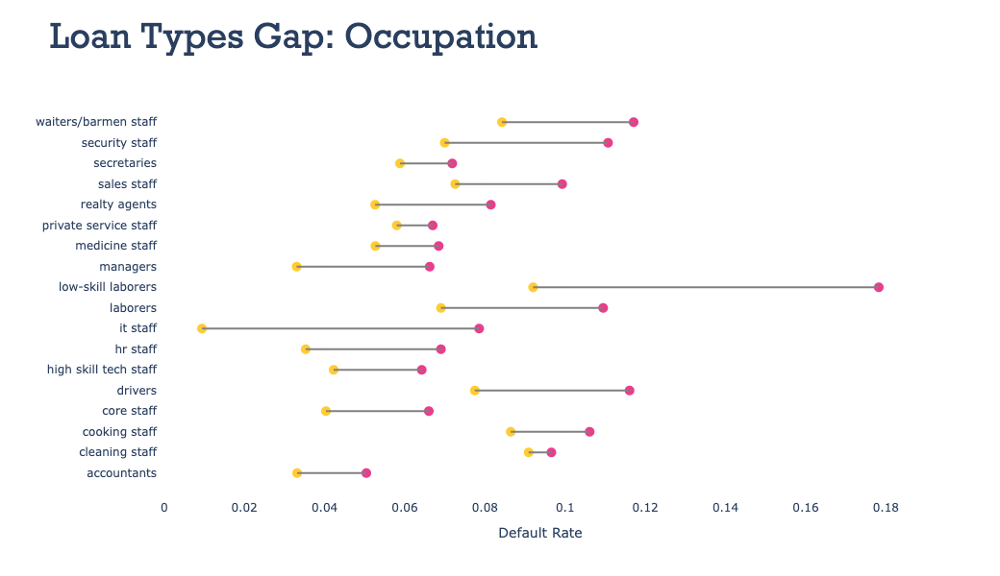

In [153]:
source = data_io['applications'].groupby(['name_contract_type', 'occupation_type'])\
    .mean().target.reset_index()
source.head()

# Use column names of df for the different parameters x, y, color, ...
fig = px.scatter(source, x="target", y="occupation_type", color="name_contract_type",
                 title="Loan Types Gap: Occupation",
                 height=600,
                 labels={"target":"Default Rate"},
                 color_discrete_map={'revolving loans':'#ffcc33',
                                'cash loans':'#e83e8c'}
                )

fig.update_traces(marker_size=10)

# add lines
for occ in source.occupation_type.unique():
    data = source.query('occupation_type == @occ')
    y = [occ]*2
    x0 = data[data.name_contract_type == 'revolving loans'].target.iloc[0]
    x1 = data[data.name_contract_type == 'cash loans'].target.iloc[0]
    x = [x0, x1]
    fig.add_trace(go.Scatter(x=x, y=y, name=occ,
                             hoverinfo='name+x', line_color='grey', mode='lines'))


fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                title=''
            ))
fig.update_layout(showlegend=False)

PlotMng.save_plot(fig, '1_loan_types_occupation.html')
fig

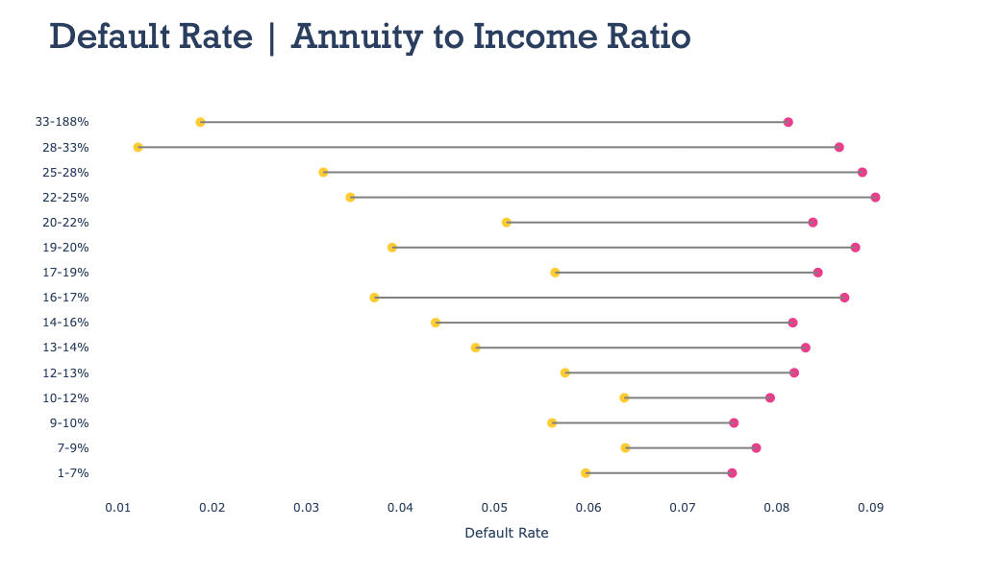

In [185]:
data_io['applications']['credit_income_ratio'] = data_io['applications'].amt_annuity \
    /data_io['applications'].amt_income_total
data_io['applications']['credit_income_ratio_bin'] = pd.qcut(data_io['applications'].credit_income_ratio, 15)
source = data_io['applications'].groupby(['name_contract_type', 'credit_income_ratio_bin'])\
    .mean().target.reset_index()
source['credit_income_ratio_bin'] = source['credit_income_ratio_bin']\
    .apply(lambda x: f'{round(x.left*100)}-{round(x.right*100)}%')

# Use column names of df for the different parameters x, y, color, ...
fig = px.scatter(source, x="target", y="credit_income_ratio_bin", color="name_contract_type",
                 title="Default Rate | Annuity to Income Ratio",
                 height=600,
                 labels={"target":"Default Rate"},
                 color_discrete_map={'revolving loans':'#ffcc33',
                                'cash loans':'#e83e8c'}
                )

fig.update_traces(marker_size=10)

# add lines
for b in source.credit_income_ratio_bin.unique():
    data = source.query('credit_income_ratio_bin == @b')
    y = [b]*2
    x0 = data[data.name_contract_type == 'revolving loans'].target.iloc[0]
    x1 = data[data.name_contract_type == 'cash loans'].target.iloc[0]
    x = [x0, x1]
    fig.add_trace(go.Scatter(x=x, y=y, name=b,
                             hoverinfo='name+x', line_color='grey', mode='lines'))


fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                title=''
            ))
fig.update_layout(showlegend=False)

PlotMng.save_plot(fig, '1_loan_type_annuity_income_ratio.html')
fig

In [44]:
df.columns[:30]

Index(['sk_id_curr', 'target', 'name_contract_type', 'code_gender',
       'flag_own_car', 'flag_own_realty', 'cnt_children', 'amt_income_total',
       'amt_credit', 'amt_annuity', 'amt_goods_price', 'name_type_suite',
       'name_income_type', 'name_education_type', 'name_family_status',
       'name_housing_type', 'region_population_relative', 'days_birth',
       'days_employed', 'days_registration', 'days_id_publish', 'own_car_age',
       'flag_mobil', 'flag_emp_phone', 'flag_work_phone', 'flag_cont_mobile',
       'flag_phone', 'flag_email', 'occupation_type', 'cnt_fam_members'],
      dtype='object')

In [46]:
THETA = 'name_income_type'

source = data_io['applications'].groupby(['label', THETA])\
    .mean().target.reset_index()

fig = px.line_polar(source, r="credit_income_ratio", theta=THETA,
                    color="label", line_close=True,
                    color_discrete_map={'no default':'#ffcc33', 'default':'#e83e8c'})


fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                title=''
            ))
fig.update_layout(showlegend=True, template=None)
fig.update_traces(fill='toself')

PlotMng.save_plot(fig, '1_default_education_annuity_ratio.html')
fig

ValueError: Value of 'r' is not the name of a column in 'data_frame'. Expected one of ['label', 'name_income_type', 'target'] but received: credit_income_ratio

In [238]:
data_io['applications'].select_dtypes(object).head(1)

,name_contract_type,code_gender,flag_own_car,flag_own_realty,name_type_suite,name_income_type,name_education_type,name_family_status,name_housing_type,occupation_type,weekday_appr_process_start,organization_type,fondkapremont_mode,housetype_mode,wallsmaterial_mode,emergencystate_mode,label
0,cash loans,m,n,y,unaccompanied,working,secondary / secondary special,single / not married,house / apartment,laborers,wednesday,business entity type 3,reg oper account,block of flats,"stone, brick",no,default


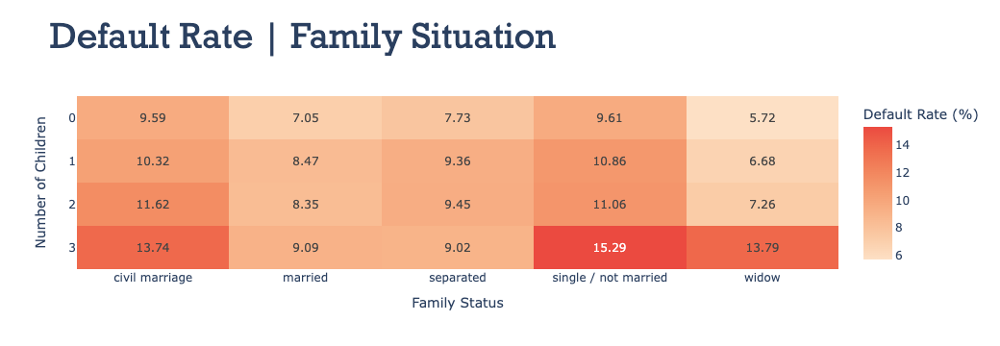

In [251]:
source = (data_io['applications']\
    .groupby(['cnt_children', 'name_family_status']).mean().target*100)\
    .unstack().drop('unknown', axis=1).loc[:3]

fig = px.imshow(source, text_auto='.2f', color_continuous_scale='Peach',
               title='Default Rate | Family Situation',
                labels={'color':'Default Rate (%)', 'x': 'Family Status', 'y': 'Number of Children'})
fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                title='Number of Children'
            ),
        xaxis = dict(
                title='Family Status'
            )
)
fig.update_layout(showlegend=False)

PlotMng.save_plot(fig, '1_family_children.html')
fig

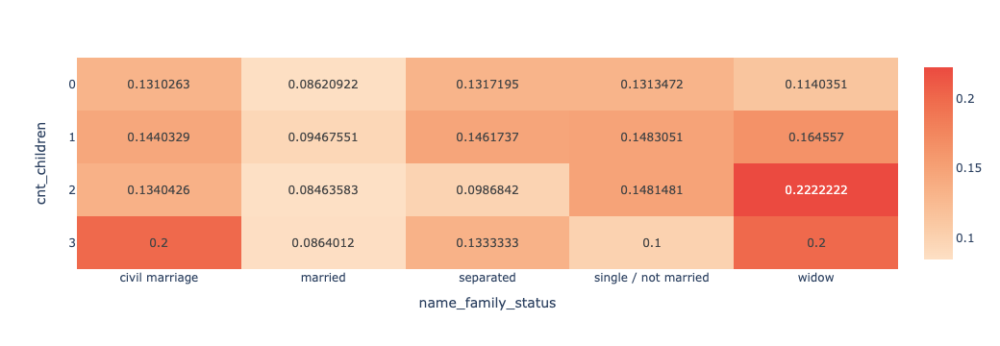

In [236]:
source = data_io['applications'].query('code_gender == "m"')\
    .groupby(['cnt_children', 'name_family_status']).mean().target\
    .unstack().drop('unknown', axis=1).loc[:3]

fig = px.imshow(source, text_auto=True, color_continuous_scale='Peach')
fig

# Family Status

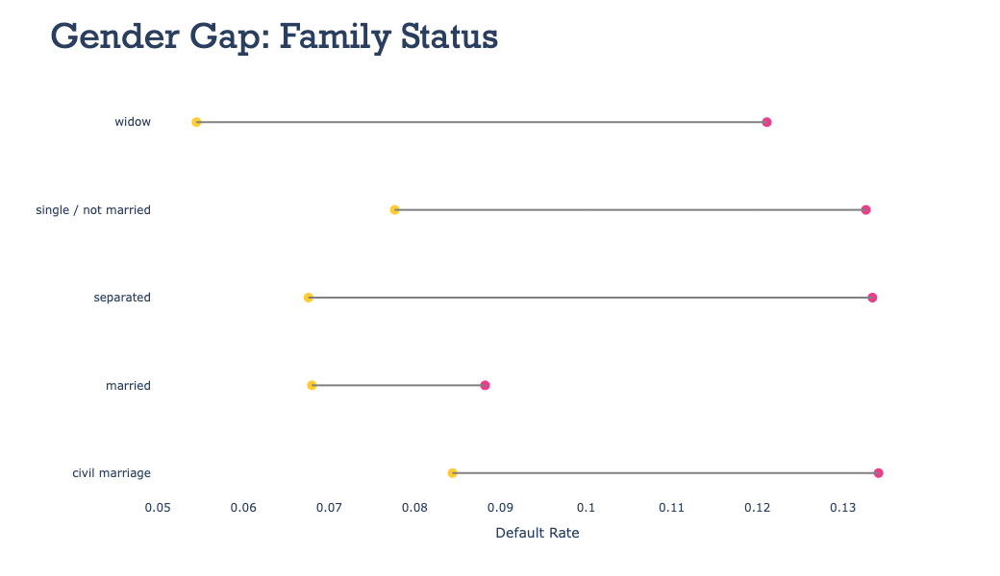

In [217]:
source = data_io['applications'].groupby(['code_gender', 'name_family_status'])\
    .mean().target.reset_index()\
    .query('(code_gender != "xna") and (name_family_status != "unknown")')
source.head()

# Use column names of df for the different parameters x, y, color, ...
fig = px.scatter(source, x="target", y="name_family_status", color="code_gender",
                 title="Gender Gap: Family Status",
                 height=600,
                 labels={"target":"Default Rate"},
                 color_discrete_map={'f':'#ffcc33',
                                'm':'#e83e8c'}
                )

fig.update_traces(marker_size=10)

# add lines
for fam in source.name_family_status.unique():
    data = source.query('name_family_status == @fam')
    y = [fam]*2
    x0 = data[data.code_gender == 'f'].target.iloc[0]
    x1 = data[data.code_gender == 'm'].target.iloc[0]
    x = [x0, x1]
    fig.add_trace(go.Scatter(x=x, y=y, name=occ,
                             hoverinfo='name+x', line_color='grey', mode='lines'))


fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                title=''
            ))
fig.update_layout(showlegend=False)

PlotMng.save_plot(fig, '1_gender_gap_family.html')
fig

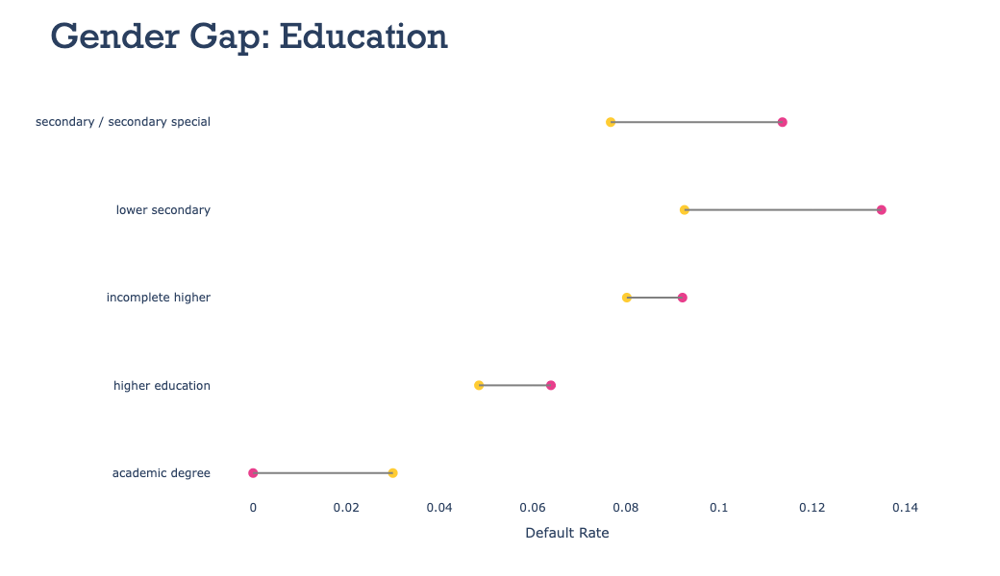

In [218]:
source = data_io['applications'].groupby(['code_gender', 'name_education_type'])\
    .mean().target.reset_index()\
    .query('(code_gender != "xna")')
source.head()

# Use column names of df for the different parameters x, y, color, ...
fig = px.scatter(source, x="target", y="name_education_type", color="code_gender",
                 title="Gender Gap: Education",
                 height=600,
                 labels={"target":"Default Rate"},
                 color_discrete_map={'f':'#ffcc33',
                                'm':'#e83e8c'}
                )

fig.update_traces(marker_size=10)

# add lines
for fam in source.name_education_type.unique():
    data = source.query('name_education_type == @fam')
    y = [fam]*2
    x0 = data[data.code_gender == 'f'].target.iloc[0]
    x1 = data[data.code_gender == 'm'].target.iloc[0]
    x = [x0, x1]
    fig.add_trace(go.Scatter(x=x, y=y, name=occ,
                             hoverinfo='name+x', line_color='grey', mode='lines'))


fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                title=''
            ))
fig.update_layout(showlegend=False)

PlotMng.save_plot(fig, '1_gender_gap_education.html')
fig

# Age

In [37]:
data_io['applications']['age'] = - data_io['applications'].days_birth / 365


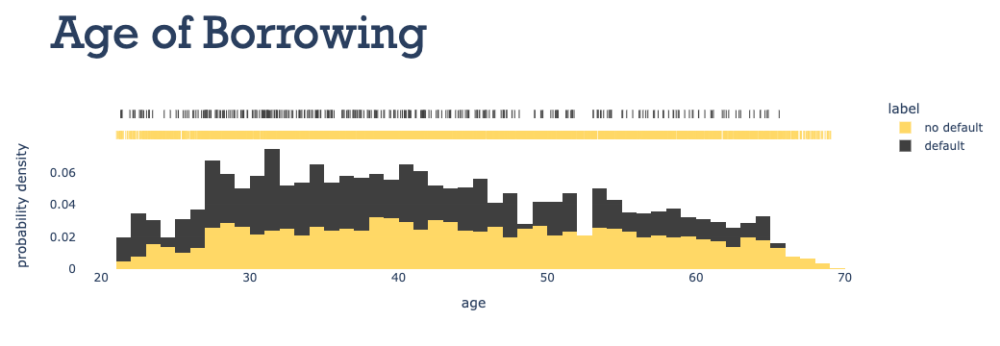

In [38]:
df = data_io['applications'].sample(4000)
fig = px.histogram(df, x="age", color="label", marginal="rug", nbins=60,
                   histnorm='probability density',
                  title='Age of Borrowing', color_discrete_map={'no default':'#ffcc33',
                                'default':'#000'})

fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=45,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
fig.update_traces(opacity=0.75)

PlotMng.save_plot(fig, '1_age.html')
fig

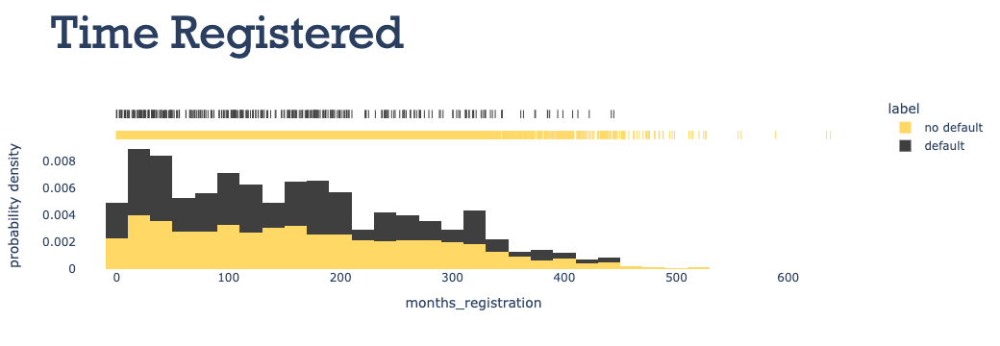

In [40]:
data_io['applications']['months_registration'] = - data_io['applications'].days_registration / 30
data_io['applications']['days_registration'] = - data_io['applications'].days_registration
df = data_io['applications'].sample(4000)
fig = px.histogram(df, x="months_registration", color="label", marginal="rug", nbins=60,
                   histnorm='probability density',
                  title='Time Registered', color_discrete_map={'no default':'#ffcc33',
                                'default':'#000'})

fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=45,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
fig.update_traces(opacity=0.75)

PlotMng.save_plot(fig, '1_days_registration.html')
fig

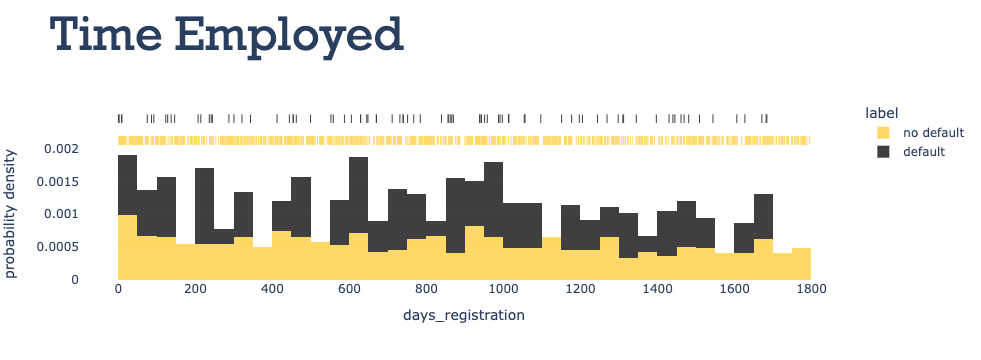

In [41]:
fig = px.histogram(df.query('months_registration <= 60'), x="days_registration", color="label", marginal="rug", nbins=60,
                   histnorm='probability density',
                  title='Time Employed', color_discrete_map={'no default':'#ffcc33',
                                'default':'#000'})

fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=45,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
fig.update_traces(opacity=0.75)
PlotMng.save_plot(fig, '1_months_employed_less_year.html')
fig

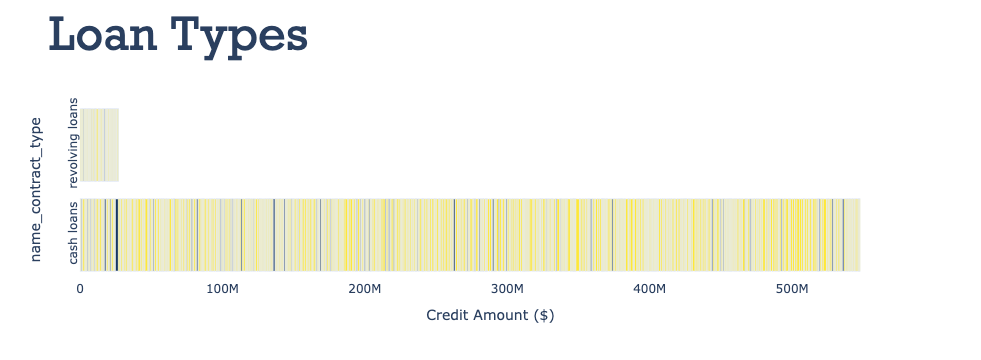

In [46]:
df = data_io['applications'].sample(1000)
fig = px.bar(df, y="name_contract_type", x="amt_credit", color='target',
             title='Loan Types',
            labels=dict(amt_credit="Credit Amount ($)"),
            color_continuous_scale=px.colors.sequential.Cividis_r,
            color_discrete_map={'no default':'#ffcc33',
                                'default':'#f7f6f1'})

fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=45,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
fig.update_yaxes(visible=True, showticklabels=True, tickangle=270)
fig.update_coloraxes(showscale=False)

PlotMng.save_plot(fig, '0_barh_loan_type.html')
fig

# External Scores

In [254]:
SCORES_COLS = ['ext_source_1', 'ext_source_2', 'ext_source_3']

In [270]:
df = data_io['applications'][['target', 'label', *SCORES_COLS]]
df.head(1)

,target,label,ext_source_1,ext_source_2,ext_source_3
0,1,default,0.083037,0.262949,0.139376


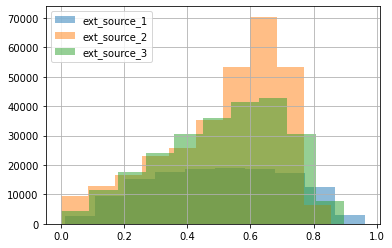

In [261]:
for score in SCORES_COLS:
    df[score].hist(alpha=0.5, label=score)
plt.legend()

In [285]:
df.shape

(307511, 5)

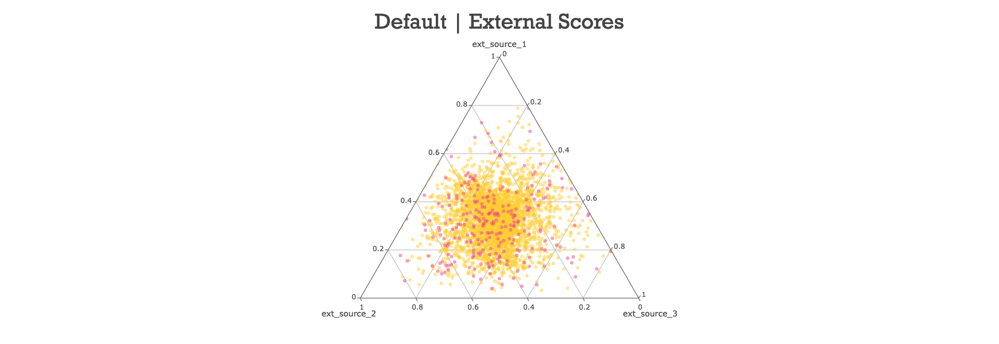

In [297]:
fig = px.scatter_ternary(df.sample(10000), a="ext_source_1", b="ext_source_2", c="ext_source_3",
    color="label", size_max=15, opacity=0.5,
    color_discrete_map={'no default':'#ffcc33', 'default':'#e83e8c'},
                        height=600, title='Default | External Scores')
fig.update_layout(
        title_font_family="Rockwell",
        template=None,
        showlegend=False,
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))

PlotMng.save_plot(fig, '1_external_scores_ternary.html')
fig

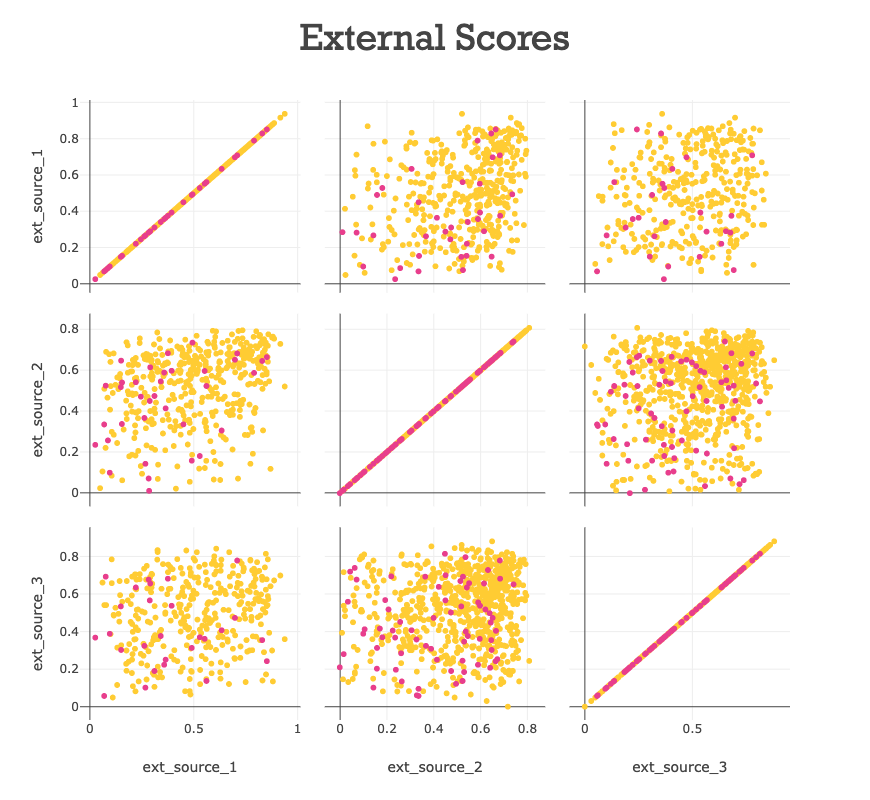

In [311]:
fig = px.scatter_matrix(df.sample(1000),
    dimensions=SCORES_COLS,
    color="label", height=800,
   color_discrete_map={'no default':'#ffcc33', 'default':'#e83e8c'},
    title='External Scores')
fig.update_layout(
        title_font_family="Rockwell",
        template=None,
        showlegend=False,
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))

PlotMng.save_plot(fig, '1_external_scores.html')
fig

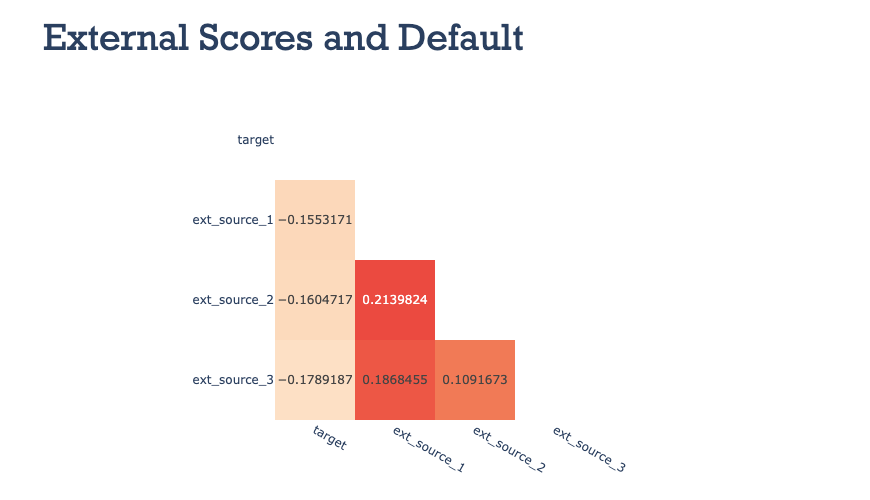

In [323]:
source = df.corr() + np.triu(np.full_like(df.corr(), np.nan))

fig = px.imshow(source, text_auto=True, color_continuous_scale='Peach',
               title='External Scores and Default', height=500)
fig.update_layout(
        title_font_family="Rockwell",
        showlegend=False,
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
fig.update_coloraxes(showscale=False)

PlotMng.save_plot(fig, '1_external_scores_corr.html')
fig

# Documents

In [327]:
DOC_COLS = [col for col in data_io['applications'] if col.startswith('flag_document_')]
df = data_io['applications'][['target', 'label', *DOC_COLS]]
df.head(1)

,target,label,flag_document_2,flag_document_3,flag_document_4,flag_document_5,flag_document_6,flag_document_7,flag_document_8,flag_document_9,...,flag_document_12,flag_document_13,flag_document_14,flag_document_15,flag_document_16,flag_document_17,flag_document_18,flag_document_19,flag_document_20,flag_document_21
0,1,default,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [356]:
def_rates = dict()
for col in DOC_COLS:
    d = df.groupby(col).mean().target
    def_rates[col] = {0: d.loc[0], 1: d.loc[1]}
source = pd.DataFrame(def_rates).T.reset_index()
source = pd.melt(source, id_vars='index', value_vars=[0,1])
source.columns = ['document', 'flag', 'default_rate']
source.document = [' '.join(d.split('flag_')[1].split('_')) for d in source.document]
source.document = source.document.str.capitalize()
source.head(1)

,document,flag,default_rate
0,Document 2,0,0.080719


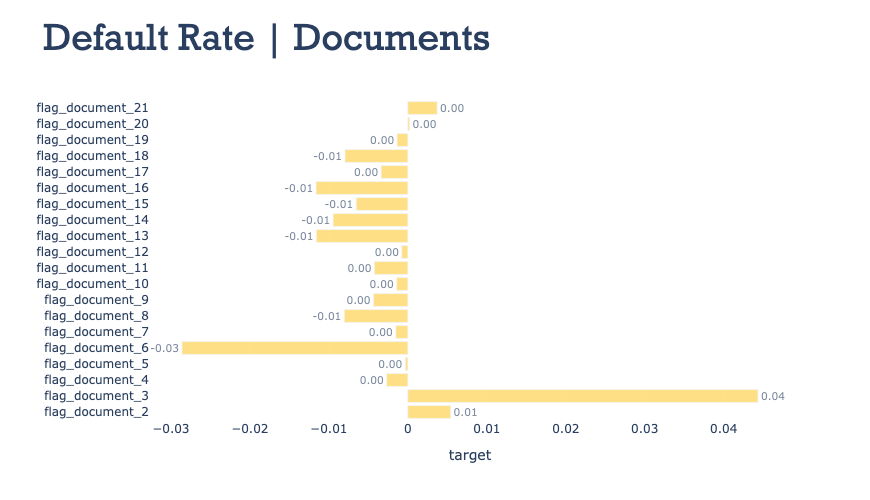

In [344]:
source = df.corr()[['target']].drop('target').reset_index()
fig = px.bar(source, y='index', x='target', text_auto='.2f',
            title="Default Rate | Documents",
            height=500)

fig.update_traces(textfont_size=12,
                  textangle=0,
                  textposition="outside",
                  cliponaxis=False)
fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        yaxis=dict(title=''),
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
fig.update_traces(marker_color='#ffcc33',opacity=0.6)
PlotMng.save_plot(fig, '1_documents.html')
fig.show()

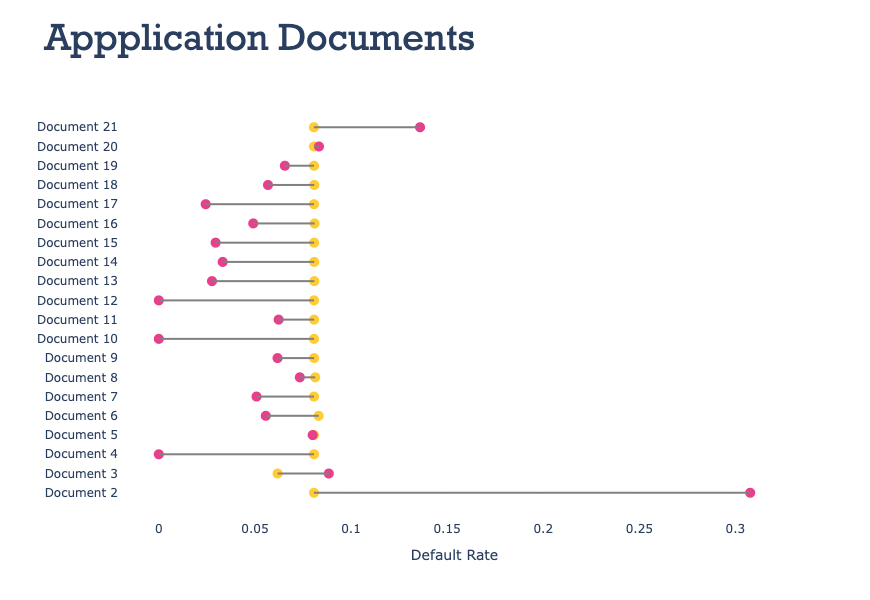

In [359]:
# Use column names of df for the different parameters x, y, color, ...
fig = px.scatter(source, x="default_rate", y="document", color="flag",
                 title="Appplication Documents",
                 height=600,
                 labels={"default_rate":"Default Rate"},
                 color_discrete_map={0:'#ffcc33',
                                     1:'#e83e8c'}
                )

fig.update_traces(marker_size=10)

# add lines
for doc in source.document.unique():
    data = source.query('document == @doc')
    y = [doc]*2
    x0 = data[data.flag == 0].default_rate.iloc[0]
    x1 = data[data.flag == 1].default_rate.iloc[0]
    x = [x0, x1]
    fig.add_trace(go.Scatter(x=x, y=y, name=doc,
                             hoverinfo='name+x', line_color='grey', mode='lines'))


fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=35,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ),
        yaxis = dict(
                title=''
            ))
fig.update_layout(showlegend=False)

PlotMng.save_plot(fig, '1_documents.html')
fig

In [363]:
for col in DOC_COLS:
    print(col, data_io['applications'][col].value_counts().loc[1])

flag_document_2 13
flag_document_3 218340
flag_document_4 25
flag_document_5 4648
flag_document_6 27078
flag_document_7 59
flag_document_8 25024
flag_document_9 1198
flag_document_10 7
flag_document_11 1203
flag_document_12 2
flag_document_13 1084
flag_document_14 903
flag_document_15 372
flag_document_16 3053
flag_document_17 82
flag_document_18 2500
flag_document_19 183
flag_document_20 156
flag_document_21 103


In [364]:
data_io['applications'].query('flag_document_2 == 1')

,sk_id_curr,target,name_contract_type,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,amt_credit,amt_annuity,...,amt_req_credit_bureau_mon,amt_req_credit_bureau_qrt,amt_req_credit_bureau_year,label,age,months_registration,age_bin,income_bin,credit_income_ratio,credit_income_ratio_bin
23923,127827,0,cash loans,f,n,y,2,135000.0,1440000.0,41152.5,...,NaN,NaN,NaN,no default,37.010959,247.566667,"(36.0, 37.764]","(115020.0, 137362.5]",0.093750,"(0.28, 0.333]"
33976,139373,1,cash loans,m,y,y,0,157500.0,1323000.0,37692.0,...,NaN,NaN,NaN,default,58.476712,273.800000,"(58.4, 60.77]","(137362.5, 159705.0]",0.119048,"(0.223, 0.247]"
79252,191871,0,cash loans,f,y,y,1,81000.0,994500.0,30150.0,...,NaN,NaN,NaN,no default,30.638356,103.166667,"(30.151, 32.038]","(70335.0, 92677.5]",0.081448,"(0.333, 1.876]"
87010,200986,1,cash loans,f,n,y,0,67500.0,1035000.0,31036.5,...,NaN,NaN,NaN,default,57.427397,436.533333,"(56.093, 58.4]","(47992.5, 70335.0]",0.065217,"(0.333, 1.876]"
98999,214947,0,cash loans,f,n,y,1,104850.0,1417500.0,40383.0,...,NaN,NaN,NaN,no default,42.517808,86.533333,"(41.29, 43.151]","(92677.5, 115020.0]",0.073968,"(0.333, 1.876]"
109258,226714,0,cash loans,f,n,y,0,90000.0,697500.0,22500.0,...,NaN,NaN,NaN,no default,47.424658,371.633333,"(47.178, 49.416]","(70335.0, 92677.5]",0.129032,"(0.247, 0.28]"
186302,315976,0,cash loans,m,y,y,2,67500.0,274500.0,7947.0,...,NaN,NaN,NaN,no default,40.536986,298.366667,"(39.496, 41.29]","(47992.5, 70335.0]",0.245902,"(0.104, 0.119]"
187327,317160,1,cash loans,f,y,y,0,360000.0,1327500.0,42952.5,...,NaN,NaN,NaN,default,48.572603,299.766667,"(47.178, 49.416]","(338445.0, 360787.5]",0.271186,"(0.119, 0.132]"
240334,378362,1,cash loans,f,n,n,0,117000.0,2281500.0,65128.5,...,NaN,NaN,NaN,default,43.991781,23.633333,"(43.151, 45.101]","(115020.0, 137362.5]",0.051282,"(0.333, 1.876]"
247300,386151,0,cash loans,f,n,y,2,90000.0,607500.0,17307.0,...,NaN,NaN,NaN,no default,40.232877,206.800000,"(39.496, 41.29]","(70335.0, 92677.5]",0.148148,"(0.186, 0.203]"


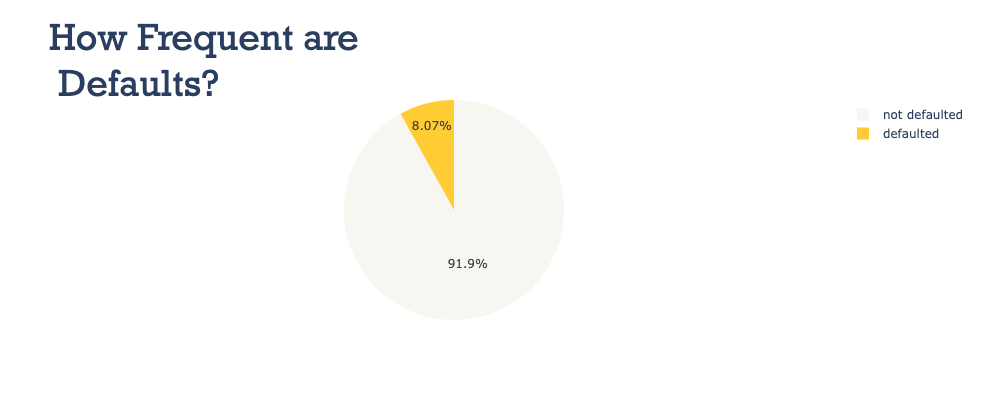

In [44]:
fig = px.pie(source, values='% of applications', names='label', color='label',
             width=600, height=400, hover_name="label",
             title='How Frequent are<br> Defaults?',
            color_discrete_map={'defaulted':'#ffcc33',
                                'not defaulted':'#f7f6f1'})

fig.update_layout(
    title_font_family="Rockwell",
    title_font_size=35,
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell",
    ))

PlotMng.save_plot(fig, '0_pie_default.html')
fig

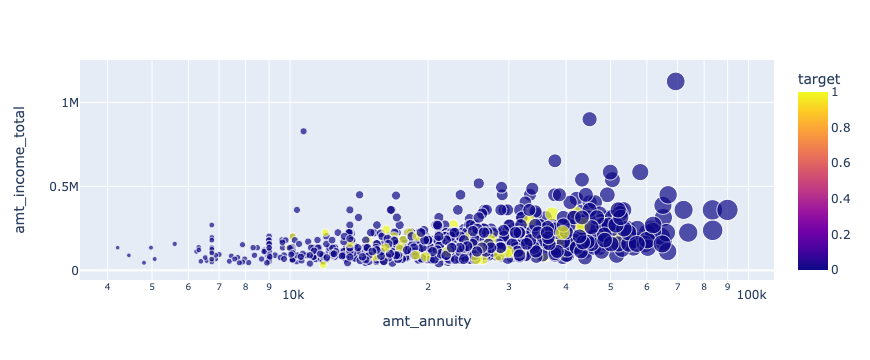

In [301]:
source = data_io['applications'].sample(1000)
fig = px.scatter(source, x="amt_annuity", y="amt_income_total", size="amt_annuity", color="target",
           hover_name="target", size_max=15, log_x=True)
fig.show()

In [304]:
data_io['applications'].cnt_fam_members.clip(None, 7).value_counts()

2.0    158357
1.0     67847
3.0     52601
4.0     24697
5.0      3478
6.0       408
7.0       121
Name: cnt_fam_members, dtype: int64

In [305]:
data_io['applications'].cnt_fam_members = data_io['applications'].cnt_fam_members.clip(None, 7)

In [306]:
data_io['applications'].groupby('cnt_fam_members').target.mean()

cnt_fam_members
1.0    0.083644
2.0    0.075835
3.0    0.087603
4.0    0.086488
5.0    0.094020
6.0    0.134804
7.0    0.123967
Name: target, dtype: float64

## income

In [49]:
income_99th_perc = np.percentile(data_io['applications'].amt_income_total, 99)
data_io['applications'].amt_income_total = data_io['applications'].amt_income_total.clip(None, income_99th_perc)

In [ ]:
fig = px.bar(data_io['applications'].sample(5000), x="amt_income_total", color="label",
                   histnorm='probability density',
                  title='Income')

fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=45,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
fig.update_traces(opacity=0.75)
PlotMng.save_plot(fig, 'hello.html')
fig

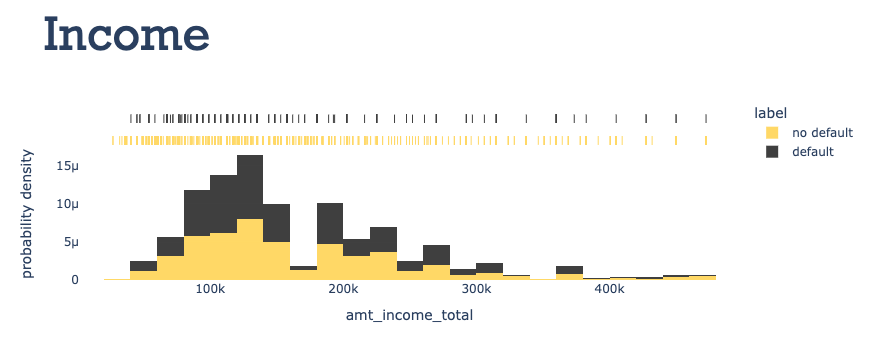

In [50]:
fig = px.histogram(data_io['applications'].sample(5000), x="amt_income_total", color="label", marginal="rug", nbins=30,
                   histnorm='probability density',
                  title='Income',
                   color_discrete_map={'no default':'#ffcc33',
                                'default':'#000'})

fig.update_layout(
        title_font_family="Rockwell",
        title_font_size=45,
        hoverlabel=dict(
            bgcolor="white",
            font_size=16,
            font_family="Rockwell",
        ))
fig.update_traces(opacity=0.75)
PlotMng.save_plot(fig, 'hello.html')
fig